In [ ]:
from ultralytics import YOLO
import numpy as np
import cv2
from google.colab.patches import cv2_imshow # костыль коллаба

In [21]:
def plot_bboxes(results):
    img = results[0].orig_img
    names = results[0].names
    scores = results[0].boxes.conf.numpy()
    classes = results[0].boxes.cls.numpy()
    boxes = results[0].boxes.xyxy.numpy().astype(np.int32)
    for score, cls, bbox in zip(scores, classes, boxes):
        class_label = names[cls]
        label = f"{class_label} : {score:0.2f}"
        lbl_margin = 10
        img = cv2.rectangle(img, (bbox[0], bbox[1]),
                            (bbox[2], bbox[3]),
                            color=(0, 0, 255),
                            thickness=3)
        label_size = cv2.getTextSize(label,
                                     fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                                     fontScale=5, thickness=3)
        lbl_w, lbl_h = label_size[0]
        lbl_w += 2* lbl_margin
        lbl_h += 2*lbl_margin
        cv2.putText(img, label, (bbox[0]+ lbl_margin, bbox[1]-lbl_margin),
                    fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                    fontScale=2.0, color=(0, 0, 255),
                    thickness=3)
    return img

In [27]:
def get_model(): # prepare the model
    model = YOLO('best2.pt') #Здесь должен быть путь к модели
    model.fuse()
    return model

YOLOv8n summary (fused): 168 layers, 3006623 parameters, 0 gradients, 8.1 GFLOPs

image 1/1 /content/5 (75).jpg: 384x640 1 int, 1 geo, 125.1ms
Speed: 4.8ms preprocess, 125.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


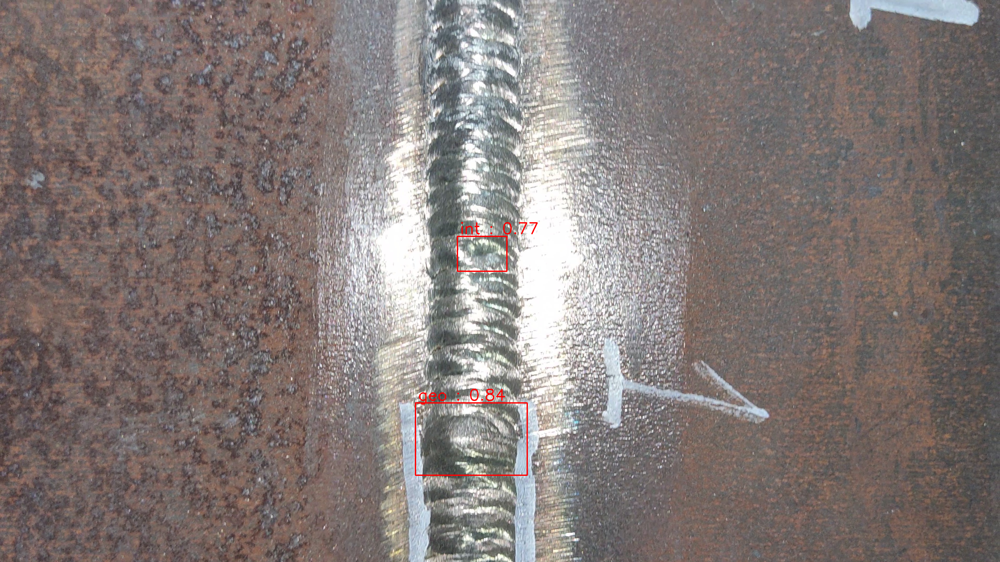

In [31]:
results = get_model()('5 (75).jpg') # путь к фотографии
img = plot_bboxes(results)
cv2_imshow(img)      #Если запускать с обычной IDE, то писать cv2.imshow(<image>)
cv2.waitKey(0)
cv2.destroyAllWindows()